# IMBD 2022 - Project B EDA Advanced

## About Project B
For the introduction, please refer to `eda_B.ipynb`.

|  | **金獎資格** | **銀獎資格** |
| -------- | -------- | -------- |
| RMSE     | **< 0.049**     | **< 0.059**    |

## About this Notebook
In this kernel, we will do **advanced** EDA and build new modeling techniques from different perspective.

<a id="toc"></a>
## Table of Contents
* [1. Cross-Layer Analysis](#xlayer)
    * *[Cross-Layer Matching](#match)*
* [2. A Quick Modeling](#model)
    * *[Heuristics](#heur)*
    * *[Traditional TS Modeling](#ts)*
    * *[Simple ML Modeling](#ml)*
    * *[⭐CV Reliability Study](#rely)*
    * *[Feature Engineering](#fe)*


<div class="alert alert-danger">
    <h5>打上星號⭐為較重要的章節，內含決定性的發現以及分析過程。</h5>
</div>

<div class="alert alert-danger">
    <h5><strong>初步想法修正 (延續 <code>eda_B.ipynb</code> )</strong></h5>
    <ol>
        <li>先把摩耗處理成當層加工後的增減值來做預測比較合理。</li>
            <ul>
                <li>(10/30) 每個層級的資訊其實都有機會可以在拆成<strong>更細的操作</strong>。</li>
                <li>(10/30) 由於先前專注在層與層之間分開分析與處理，忽略掉不少<strong>跨層特性</strong>。根據保哥的分析，跨層有不少有趣的現象可以深入做探討與利用，所以建模方式要調整與驗證看看。</li>
            </ul>
        <li>PDF應該是給到train2答案，可以協助確認一下unseen data的<code>MaxWear</code>分布是否相似。此外，需注意train2和test的層數非常接近，所以或許train2的重要性會大於train1 (純猜測)。</li>
            <ul>
                <li>(10/30) 可嘗試將<code>train2</code>24層對應回<code>train1</code>46層。</li>
            </ul>
        <li>(10/31)<code>train1</code>, <code>train2</code> and <code>test</code>分布類似但不完全相同。</li>
            <ul>
                <li><code>train1</code>為第一把智慧刀把，<code>train2</code>和<code>test</code>為<strong>另一把智慧刀把</strong>，但不確定後兩者是否相同 (因為QA5&6矛盾)。</li>
                <li>被切削的工件材質也不完全相同，但不會出現過大差異性。</li>
                <li>切削行為與條件也非完全相同，所以工件各面受力行為也有差異性，連帶影響刀具的磨耗行為。</li>
            </ul>
    </ol>
</div>

### 想法小結
從QA回答中可以看出，三份資料集僅能確定用來切削的**刀具**是同一把，且皆從全新的狀態開始進行加工。然而，刀具磨耗還牽涉到**智慧刀把規格、切削的工件材質以及切削行為與條件**，這些項目在三份資料集中皆非完全相同，故我們需要建構一個完整的pipeline有效率地來對不同的資料集做驗證 (*i.e.*, 當天的`train2`)，也需先設想好待測試的情境，以讓當天的開發與模型調整更快速且準確。

## Domain Knowledge
### *此題目價值為何?*
透過磨耗監測、刀具壽命判斷等，將有機會提升待加工產品良率甚至刀具倉儲管理 (過剩囤積或缺刀等)。

### *磨耗來源*
刀具切削加工的**熱與摩擦產生之物理與化學效應**皆會導致磨耗產生 (*e.g.*, 切削過程中刀具的刀頭部位因不斷地受到很大的作用力、高溫和激烈的摩擦作用而**磨耗**)。

### *刀具壽命與磨損*
* 刀具**壽命**判斷依據 (壽命達到即需重磨、轉位、廢棄)
    * 達**磨耗**的預設threshold
    * 振動激化
    * 加工表面粗糙度惡化
    * 斷屑不良
    * 崩刃
* 影響壽命的關鍵因素
    * 刀具與工件材料
    * 切削速度
        * 速度增加、工時縮短、加工面精度佳；<strong>磨耗加快</strong><br>
        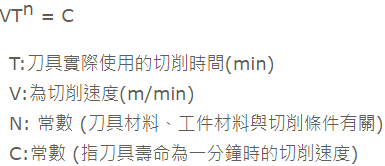
    * 切削厚度及寬度
* 磨損包括**磨耗**和**破損**
    * 磨耗原因: 熔著、刮除、擴散
    * 破損原因: 刀具幾何形狀不當、切削負荷過大、顫動或振動的衝擊作用、切削溫度超過其高溫硬度的極限、刀具本身即存在微裂縫的瑕疵等
> 此比賽則關注**磨耗**的部分。    

### *常用檢測儀器*
#### 1. 電流訊號 (**Servo** Guide軟體，可以對應`sg`)
加工過程**驅動系統電流信號**，擷取主軸及伺服軸電流值 (下圖為2ms, 500Hz)。<br>
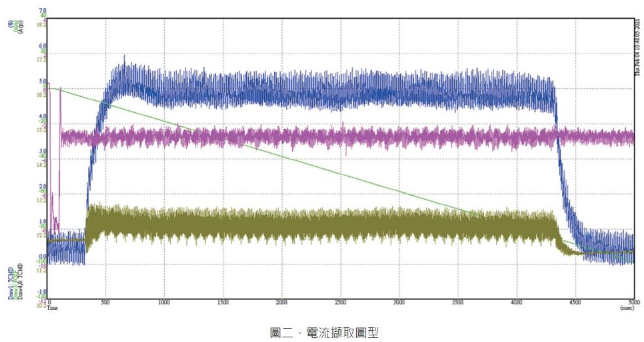
> 藍色線為主軸電流訊號，粉色線為X軸電流，褐色線為Z軸電流訊號，綠色線為X軸位置訊號；當X 軸位置從0mm移動至100mm時，擷取過程中所需的訊號，進一步分析與刀具磨耗關係。

#### 2. 通用動力計 (這個可能沒提供，無法確認)
確保可精確測量動態力 (切削力訊號)和使熱效應影響達最小。

#### 3. 智慧刀把 (可以對應`spike`)
可直接量測切削時刀具上產生之軸向力、彎矩、扭矩與溫度的測量系統。<br>
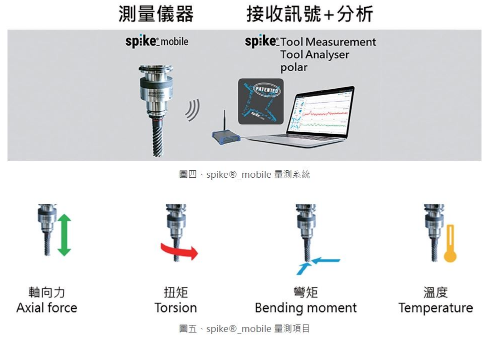
> 藉由X 和Y 方向的彎矩量測，可在銑削加工中檢測每個切削刃，且繪出spike®_polar 極座標圖，將切削前後狀態進行比較，從而診斷出**刀具的磨損**或不平衡。

刀具材質、特性 (*e.g.*, 螺旋銑刀)<br>
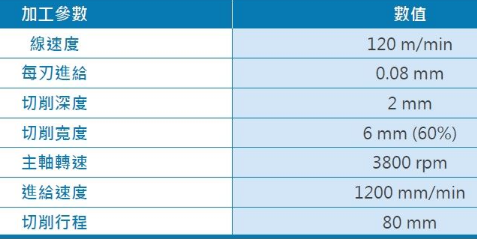

### *切削測試成果*
以下量測數據以每10道次量測一次，實驗總計切削450道次，共統計45筆數據做比較<br>

#### 1. 電流計
根據電流趨勢可知，隨著切削道次的增加，**主軸馬達電流**隨著刀具磨損的增加而增加，呈線性增長關係，差異約10.8%。若為不同製程如鑽孔，主軸和進給軸 (X、Z)馬達的電流趨勢也就會有所不同。電流大小則取決於切削參數，包含**切削速度，進給速度，進刀量以及刀具磨損量**。
> 所以這邊給的伺服資訊有可能是更細粒度的速度等，而非純電流，且可以看出當下磨耗也有機會影響下一次磨耗 (AutoRegression)。

#### 2. 動力計
Y軸向會隨切削道次的增加，刀具磨耗變大的情況下，切削力逐漸變大。<br>
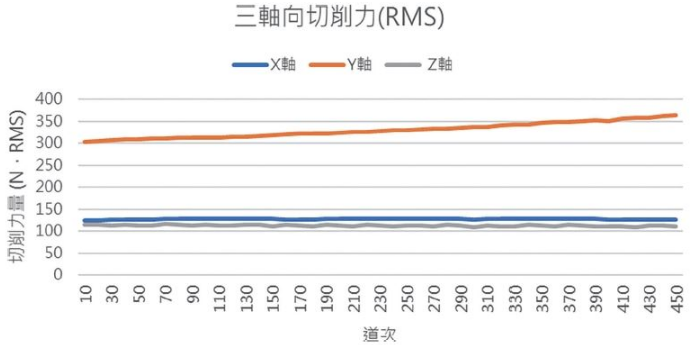

#### 3. 智慧刀把
量測數據以每10道次量測一次，實驗總計切削450道次，共統計45筆數據做比較。<br>
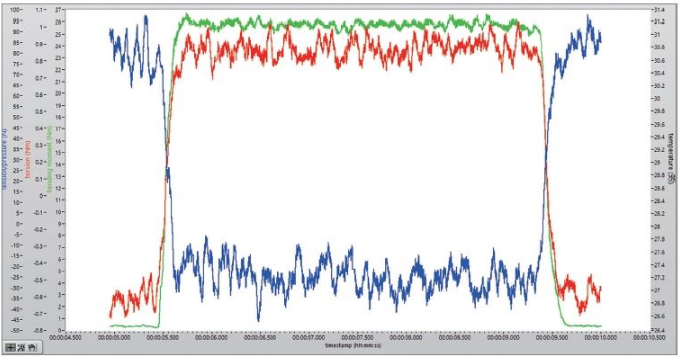
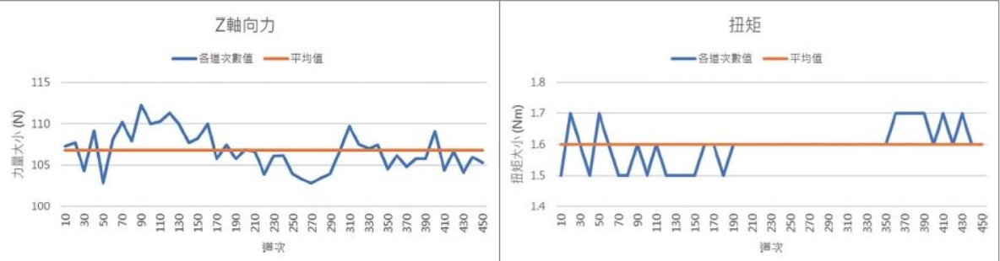
> 刀具經過長時間切削，刀刃磨耗也隨之增長，在受力方向來說Z軸向並非主要增長或變化的軸向，主要會以垂直進給軸之受力變化幅度最為明顯。

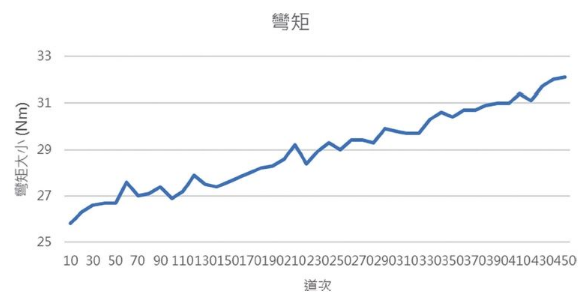
> **彎矩(bending moment)** 的數據變化呈現穩定增加的趨勢，明確反應刀具磨耗增加的現象。

### *小結*
刀具磨耗的重點訊號有**工具機電流計測得主軸馬達電流、動力計測得Y軸（垂直進給軸）切削力與智慧刀把測得彎矩**，以上三者變化幅度分別為+10.8%、+20%與+24.4%，顯示出刀具磨耗的增加趨勢與狀態，依照量測數據可知訊號靈敏度為**彎矩＞切削力（垂直進給軸）＞主軸馬達電流**，故得知在側銑切削製程中，刀具磨耗會以spike®_mobile智慧刀把測得之**彎矩數據**最為靈敏。

## Import Packages

In [25]:
%load_ext autoreload
%autoreload 2
import os
import gc
import sys
import random
import warnings
import pickle
sys.path.append("../")
from typing import Any, Dict, List, Tuple, Union

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
from tqdm import tqdm
from pandas.core.groupby.generic import DataFrameGroupBy

from utils.eda import *
import metadata

# Configuration
warnings.simplefilter("ignore")
pd.options.display.max_rows = None
pd.options.display.max_columns = None
sns.set_style("darkgrid")
colors = sns.color_palette("Set2")

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Load Data

In [2]:
RAW_DATA_PATH = "../data/raw/projectB/"
PROC_DATA_PATH = "../data/processed/projectB/"
METADATA = metadata.B
METADATA

{'PK': ['time', 'layer'],
 'SG_FEAT': ['b', 'c', 'd', 'e', 'f', 'g', 'h', 'i'],
 'SPIKE_FEAT': ['b', 'c', 'd'],
 'TARGET': 'MaxWear',
 'PROC_LAYERS': 46,
 'GP1_LEN': 26,
 'GP2_LEN': 20}

In [3]:
%%time

sg = pd.read_parquet(os.path.join(PROC_DATA_PATH, "sg.parquet"))
spike = pd.read_parquet(os.path.join(PROC_DATA_PATH, "spike_t_fix.parquet"))
wear = pd.read_csv(os.path.join(RAW_DATA_PATH, "wear.csv"))

CPU times: user 3.24 s, sys: 1.49 s, total: 4.73 s
Wall time: 1.78 s


<a id="xlayer"></a>
## 1. Cross-Layer Analysis
[**<span style="color:#FEF1FE; background-color:#535d70;border-radius: 5px; padding: 2px">Go to Table of Content</span>**](#toc)

Because wear of each layer is related to factors like revolutions per minute (轉速), feed per tooth (進給), etc. Also, `MaxWear` variations are different after different processing layers. Hence, it's worth analyzing if there's any cross-layer trend or phenomenon in provided sequence information.

In [24]:
def plot_xlayer_seq(
    info_gp: DataFrameGroupBy,
    feat: str,
    layers: List[int],
    t_range: Optional[Tuple[int, int]] = None,
) -> None:
    """Plot cross-layer feature sequences."""
    if t_range is None:
        t_range = (0, info_gp.get_group(layers[0]).shape[0])
    seq_len = t_range[1] - t_range[0]
    
    fig, ax = plt.subplots(figsize=(20, 4))
    l_cnt = 0
    for l, gp in info_gp:
        if l in layers:
            ax.plot(np.arange(seq_len), gp.iloc[t_range[0]:t_range[1]][feat], label=f"Layer{l}", alpha=1 - 0.15 * l_cnt)
            l_cnt += 1
    ax.set_title(f"Feature {feat.upper()} Sequence")
    ax.set_xlabel("Time Point")
    ax.set_ylabel("Featuer Value")
    ax.legend()
    plt.show()

In [66]:
sg_gp = sg.groupby("layer")
spike_gp = spike.groupby("layer")

<a id="match"></a>
### *Cross-Layer Matching*
[**<span style="color:#FEF1FE; background-color:#535d70;border-radius: 5px; padding: 2px">Go to Table of Content</span>**](#toc)

It's obvious that the **amplitude** of the feature is different in each layer, corresponding to the former analysis on **feature distribution and value range**.

> 震幅大小消長變化可能牽涉到當層加工程序的**最佳參數設置**，例如: 轉速在一開始幾層須設定在XX範圍，隨著加工進到中層，可能需要調整到XX範圍，最後再漸漸回到原本範圍中。這些參數設置會影響到刀具的磨耗。

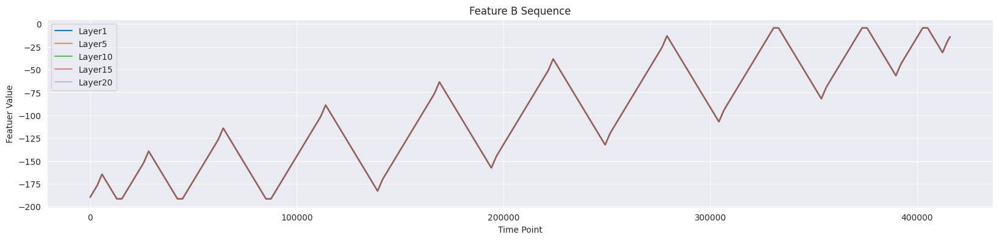

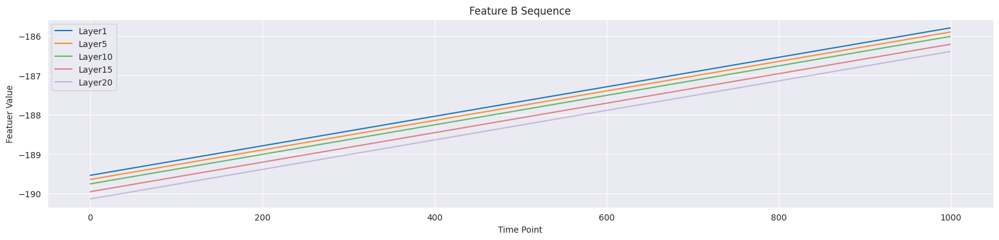

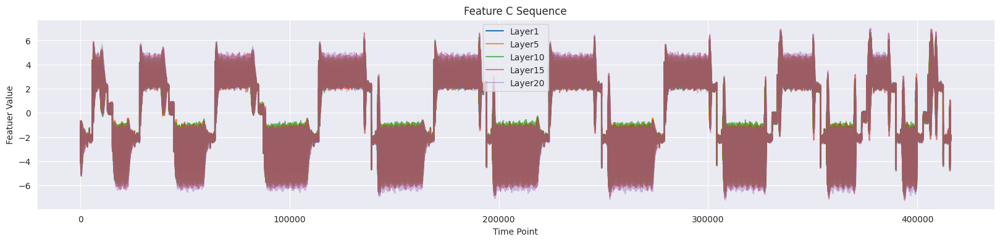

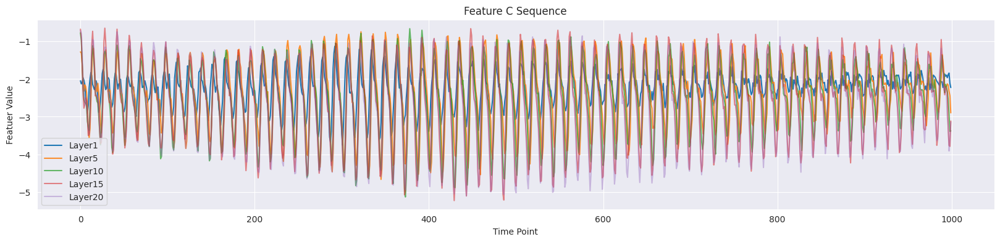

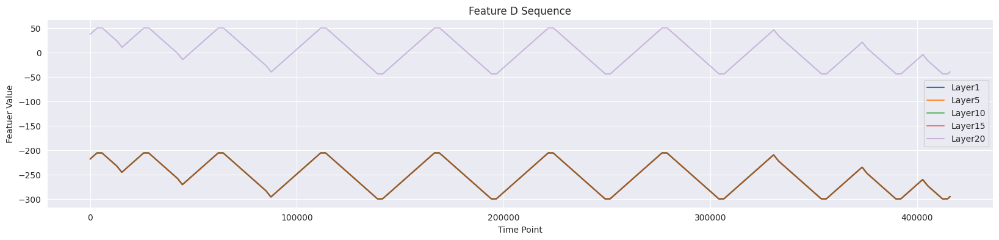

...

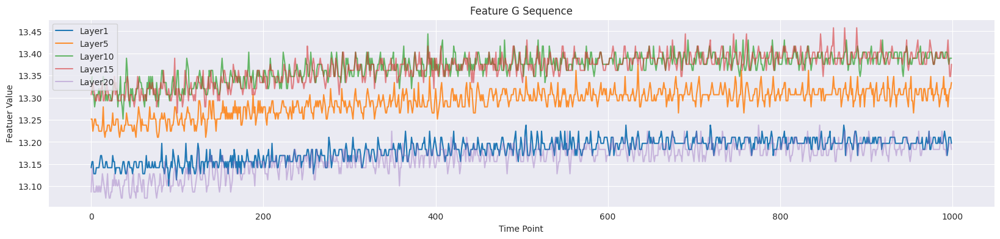

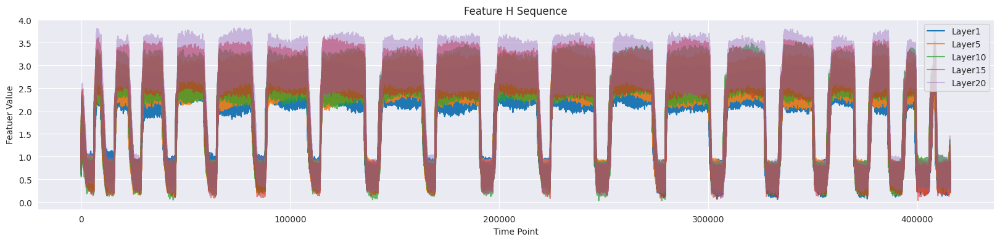

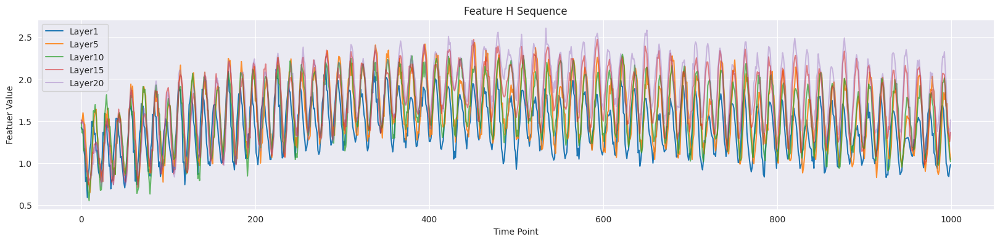

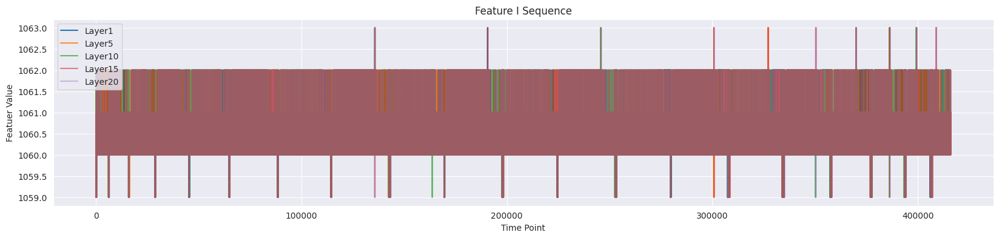

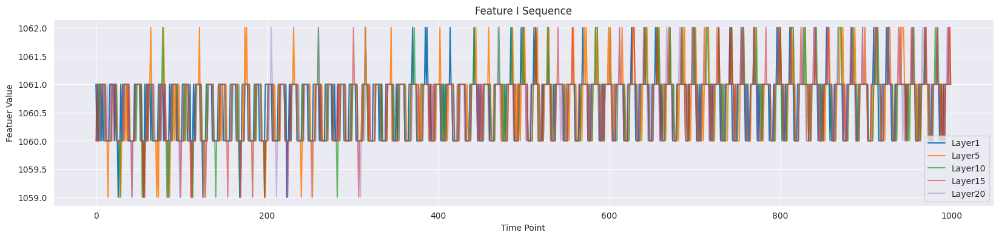

In [22]:
layers = [1, 5, 10, 15, 20]
for feat in METADATA["SG_FEAT"]:
    plot_xlayer_seq(sg_gp, feat, layers)
    plot_xlayer_seq(sg_gp, feat, layers, t_range=(0, 1000))

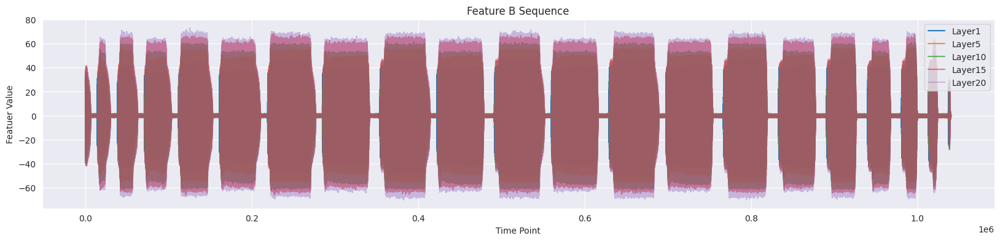

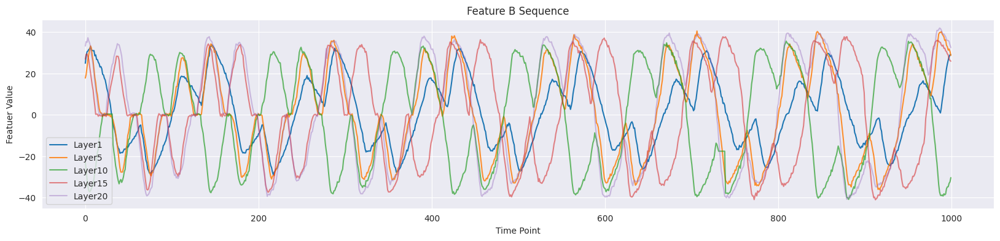

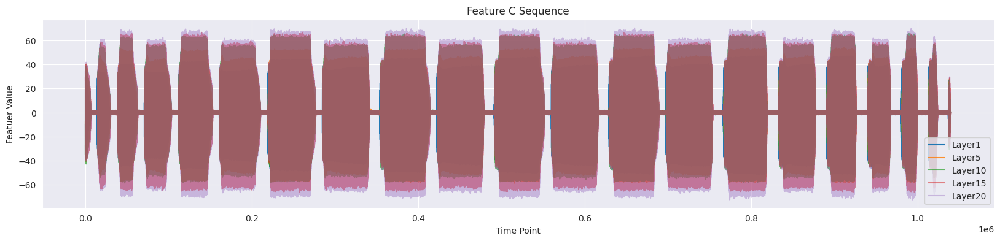

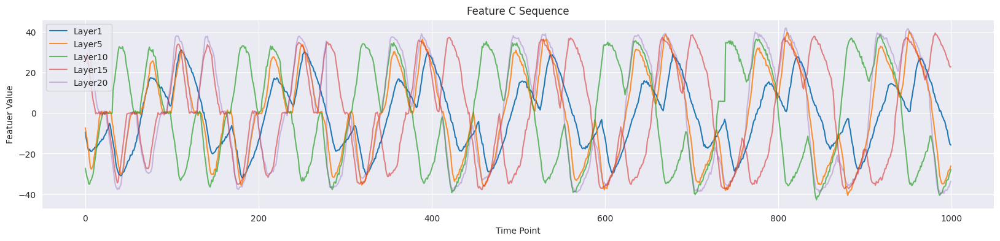

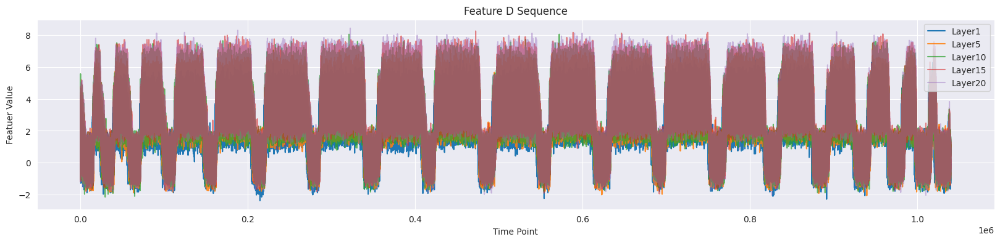

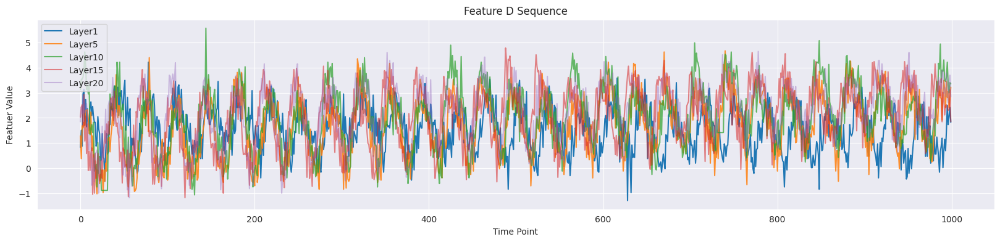

In [20]:
for feat in METADATA["SPIKE_FEAT"]:
    plot_xlayer_seq(spike_gp, feat, layers)
    plot_xlayer_seq(spike_gp, feat, layers, t_range=(0, 1000))

In layer group 2, we can also observe the similar behavior. Also, the sequence can be **synchronized** or not across different layers when they are aligned by time steps (*e.g.*, `b` of `spike` in group 1 above and group 2 below).

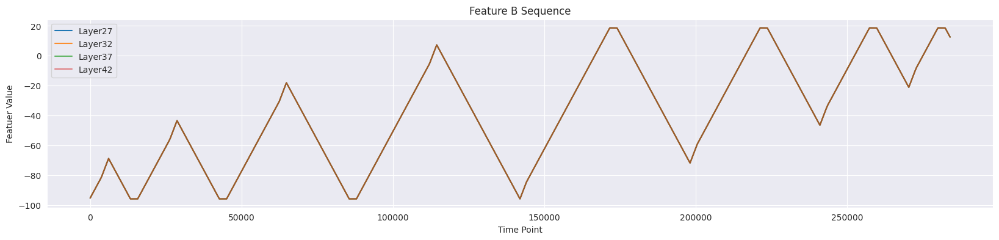

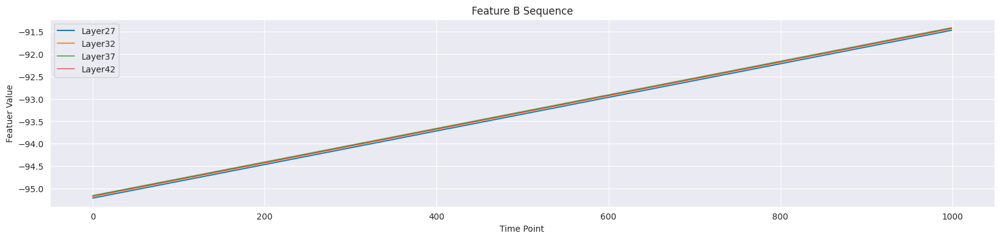

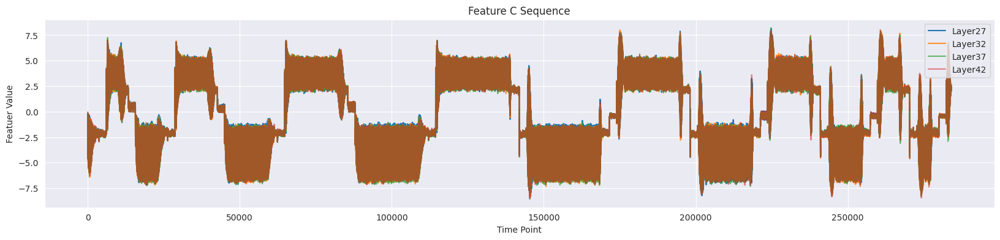

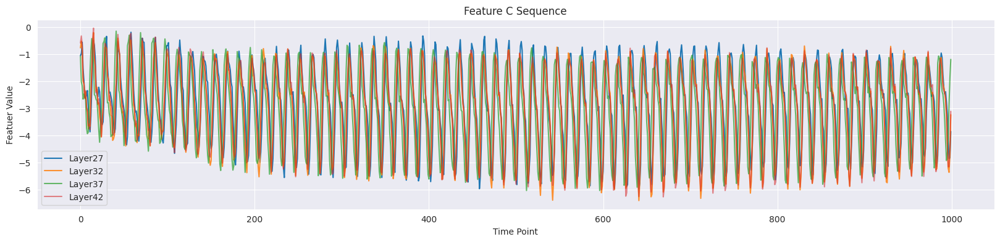

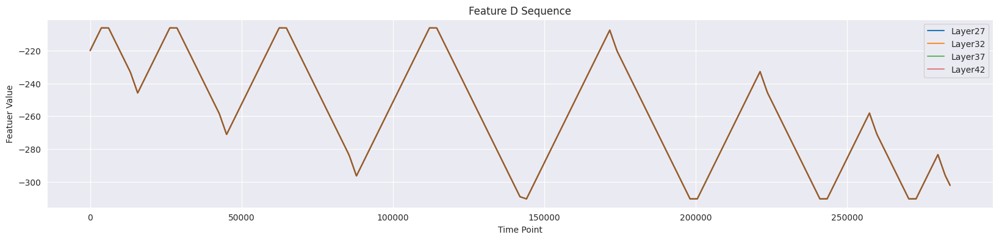

...

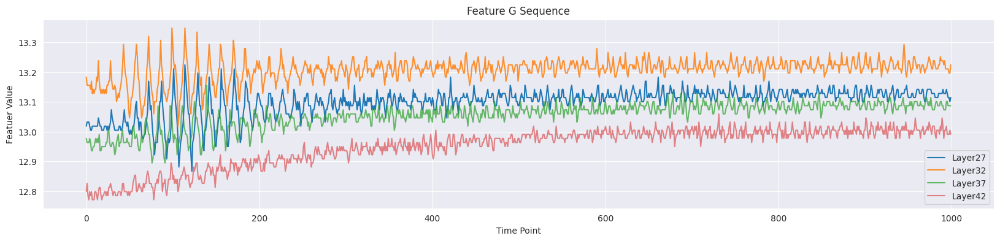

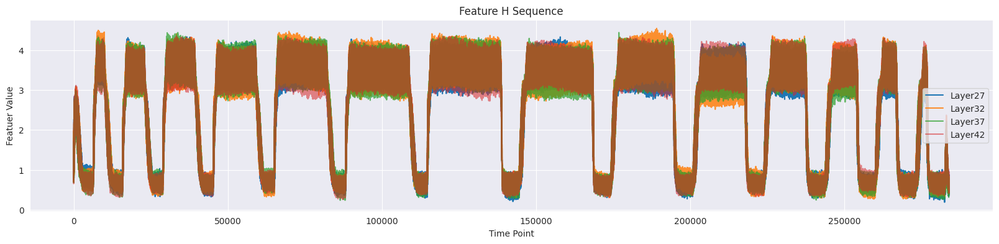

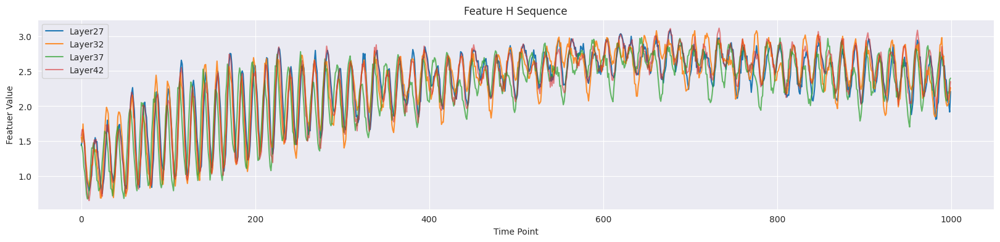

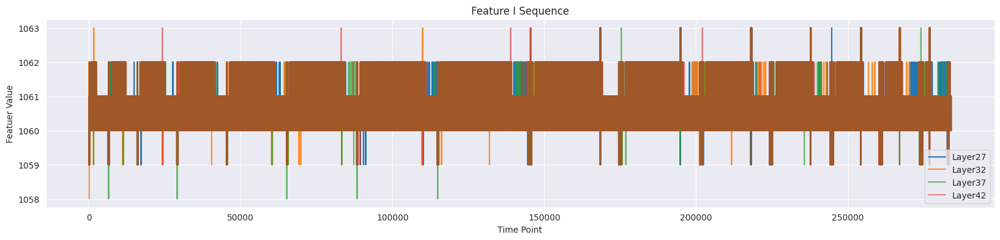

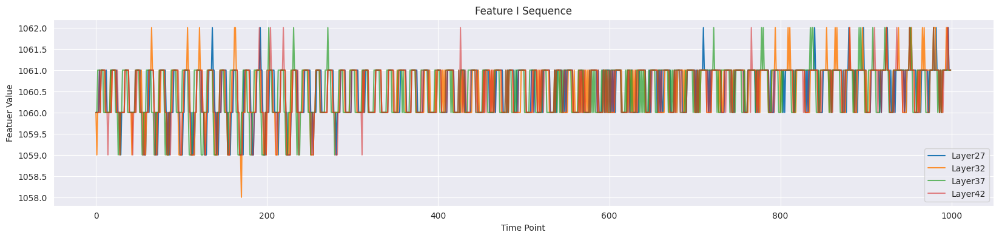

In [25]:
layers = [27, 32, 37, 42]
for feat in METADATA["SG_FEAT"]:
    plot_xlayer_seq(sg_gp, feat, layers)
    plot_xlayer_seq(sg_gp, feat, layers, t_range=(0, 1000))

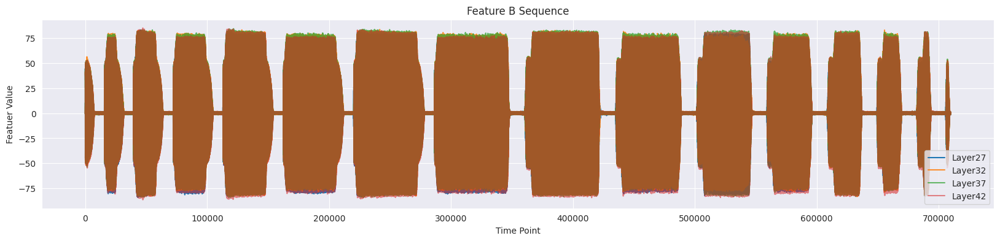

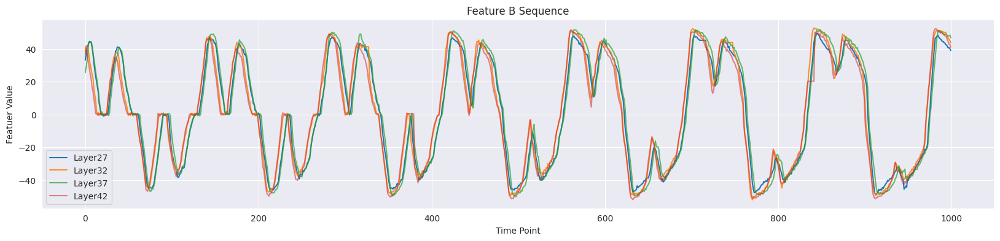

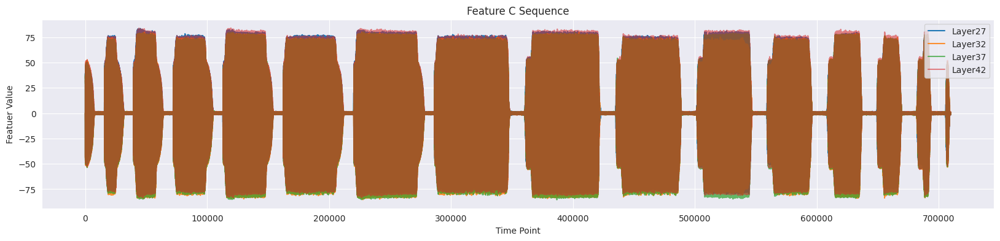

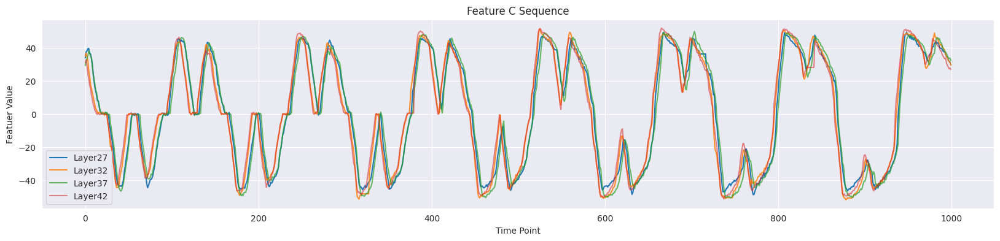

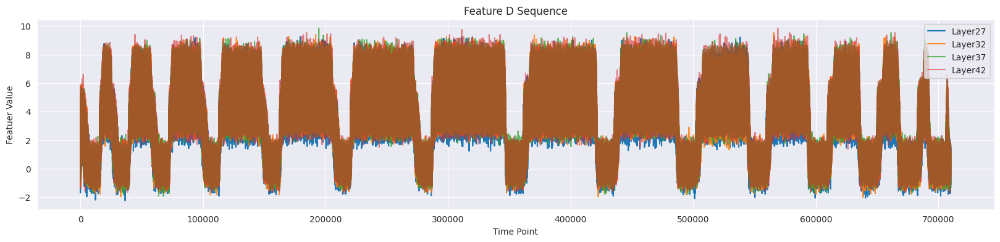

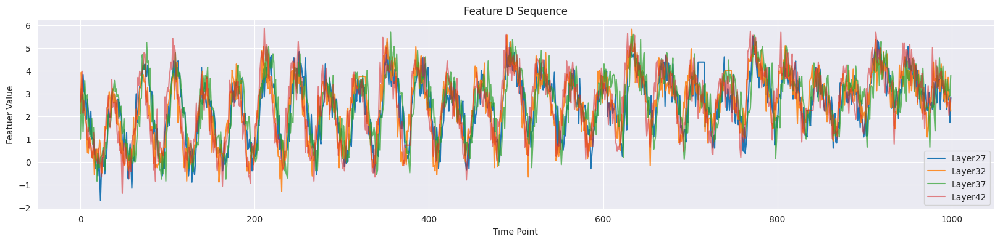

In [26]:
for feat in METADATA["SPIKE_FEAT"]:
    plot_xlayer_seq(spike_gp, feat, layers)
    plot_xlayer_seq(spike_gp, feat, layers, t_range=(0, 1000))

(Pending) **Inter-feature** relationship in the same layer is also another topic to explore.

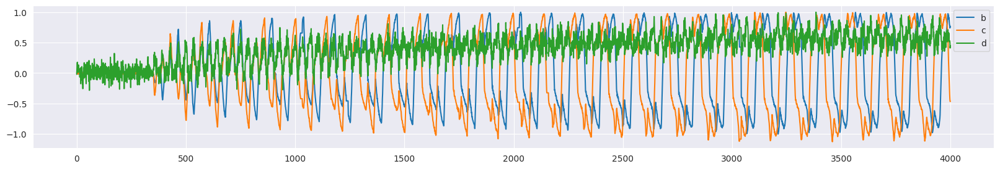

In [61]:
fig, ax = plt.subplots(figsize=(20, 3))
for i, feat in enumerate(METADATA["SPIKE_FEAT"]):
    a = spike_gp.get_group(1).iloc[14000:18000][feat]
    a = a / a.max()
    ax.plot(np.arange(len(a)), a, label=feat)
ax.legend()
fig.show()

<a id="model"></a>
## 2. A Brand New Modeling
[**<span style="color:#FEF1FE; background-color:#535d70;border-radius: 5px; padding: 2px">Go to Table of Content</span>**](#toc)

This time, we take direct `MaxWear` as modeling target, instead of the wear difference.

In [4]:
rmse = lambda y_true, y_pred: np.sqrt(np.mean(np.square(y_true - y_pred)))

def plot_pred_and_gt(
    oof_preds: Union[List[np.ndarray], Dict[str, np.ndarray]],
) -> None:
    """Plot prediction versus groundtruth.
    
    To facilitate model comparison, `oof_preds` can contain predictions
    from different models.
    """
    fig, ax = plt.subplots(figsize=(6, 3))
    xrange = np.arange(METADATA["PROC_LAYERS"])
    oof_preds_iter = oof_preds if isinstance(oof_preds, list) else oof_preds.items()
    
    # Wear cumulation
    for i, oof_pred in enumerate(oof_preds_iter):
        if isinstance(oof_pred, tuple):
            oof_pred_name, oof_pred_val = oof_pred[0], oof_pred[1]
        else:
            oof_pred_name, oof_pred_val = i, oof_pred
        ax.plot(xrange, oof_pred_val, "+-", label=f"Wear Cum Pred {oof_pred_name}")
    ax.plot(xrange, wear["MaxWear"], "bo-", label="Wear Cum Gt")
    ax.set_title("Wear Cumulation (Pred vs Gt)")
    ax.set_xlabel("Sample ID (Layer)")
    ax.set_xticks(xrange, xrange+1)
    ax.tick_params(axis='x', rotation=45)
    ax.set_ylabel("Wear Cumulation")
    ax.legend()
    plt.tight_layout()
    
def get_final_scores(oof_pred: np.ndarray) -> Dict[str, float]:
    """Derive and return final performances."""
    gt = wear["MaxWear"]
    
    # Fix the prediction of the first layer to ground truth
    oof_pred_fix = oof_pred.copy()
    oof_pred_fix[0] = gt[0]
    
    final_scores = {
        "raw": rmse(gt, oof_pred),
        "fix_layer1": rmse(gt, oof_pred_fix),
    }
    
    return final_scores

`MaxWear` cumulates layer-by-layer, and it's worth pointing out that wear **increases faster in the beginning and ending phases**, which looks like the figure below (from [*In-process Tool Wear Prediction System Based on Machine Learning Techniques and Force Analysis*](https://reader.elsevier.com/reader/sd/pii/S221282711831103X?token=E3912F7627DB62B646175D52D999623BCEC3F0F26AFC8F43AC8DCD989F68B83A19B111EC52D339D693CF8E367E171D90&originRegion=us-east-1&originCreation=20221105052238)).<br>
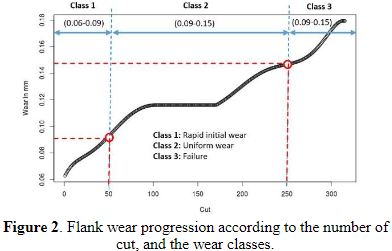

<div class="alert alert-info">
    <a id="y_sup"></a>
    <h5><strong>補充</strong></h5>
    <p>一般將刀具磨耗過程分為三個階段：初期磨耗、正常磨耗和劇烈磨損階段。在初期磨耗階段，刀具表面比較粗糙且存在微觀裂紋等缺陷，刀具與工件和切屑接觸面積小，前後刀面受到較大應力，此時刀具磨損較快；在初期磨耗階段過後，刀面逐漸變得光滑，此時刀具進入正常磨耗階段，磨損速率降低，也是工作效率與加工品值最好的階段；隨著磨損量增加、刀具變鈍、切削力增大和切削溫度升高，磨損量因此急劇上升，則進入劇烈磨損階段，到達一定極限即是要更換刀具。</p>
</div>

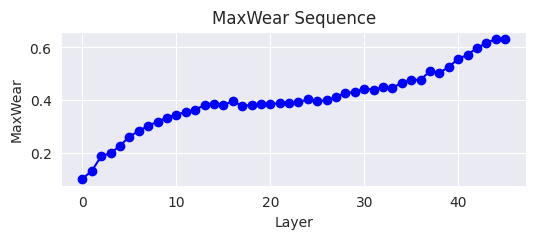

In [5]:
y = wear["MaxWear"]

fig, ax = plt.subplots(figsize=(6, 2))
ax.plot(np.arange(len(y)), y, "bo-")
ax.set_title("MaxWear Sequence")
ax.set_xlabel("Layer")
ax.set_ylabel("MaxWear")
plt.show()

<a id="heur"></a>
### *Heuristics*
[**<span style="color:#FEF1FE; background-color:#535d70;border-radius: 5px; padding: 2px">Go to Table of Content</span>**](#toc)

Let's first start from **heuristic-based** modeling techniques.

For simplicity, we take the mean of the wear sequence as the prediction. Hmm, seems not a good idea!

Final performance: {'raw': 0.11889436653515773, 'fix_layer1': 0.11039776041833296}


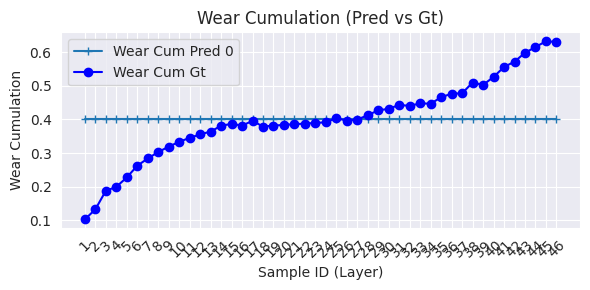

In [6]:
oof_pred_mean = np.empty(46)
oof_pred_mean.fill(np.mean(y))
plot_pred_and_gt([oof_pred_mean])
print(f"Final performance: {get_final_scores(oof_pred_mean)}")

<a id="ts"></a>
### *Traditional TS Modeling* **(Pending)**
[**<span style="color:#FEF1FE; background-color:#535d70;border-radius: 5px; padding: 2px">Go to Table of Content</span>**](#toc)

Then, let's give traditional time series models a try, because `MaxWear` of the previous layers might help estimate that of the next layer.

<a id="ml"></a>
### *Simple ML Modeling* 
[**<span style="color:#FEF1FE; background-color:#535d70;border-radius: 5px; padding: 2px">Go to Table of Content</span>**](#toc)

In [7]:
from scipy.stats import kurtosis
from sklearn.base import BaseEstimator
from sklearn.model_selection import BaseCrossValidator, KFold

from modeling.build import build_models

STATS = ["min", "max", "mean", "median", "std", "skew", kurtosis]

In [29]:
def run_cv(
    X: Union[pd.DataFrame, np.ndarray],
    y: Union[pd.DataFrame, np.ndarray],
    kf: BaseCrossValidator,
    models: List[BaseEstimator],
    show_prf: bool = True
) -> Tuple[np.ndarray, List[float], List[float]]:
    """Run cross-validation and return out-of-fold prediction and
    performance on training and validation sets.
    """
    oof_pred = np.zeros(len(y))
    tr_rmses, val_rmses = [], []

    for fold, (tr_idx, val_idx) in enumerate(kf.split(X)):
        X_tr, X_val = X.iloc[tr_idx], X.iloc[val_idx]
        y_tr, y_val = y[tr_idx], y[val_idx]

        # Fit the model
        models[fold].fit(X_tr, y_tr)

        # Perform OOF prediction
        oof_pred[val_idx] = models[fold].predict(X_val)

        # Derive RMSE on wear difference
        tr_rmses.append(rmse(y_tr, models[fold].predict(X_tr)))
        val_rmses.append(rmse(y_val, oof_pred[val_idx]))
        
    # Report peformance summary
    if show_prf:
        print("=====Performance Summary=====")
        print(f"Train RMSE: {np.mean(tr_rmses)} +- {np.std(tr_rmses)}")
        print(f"Val RMSE: {np.mean(val_rmses)} +- {np.std(val_rmses)}")
        final_score = get_final_scores(oof_pred)
        print(f"Final score: {final_score}")
    
    return oof_pred, tr_rmses, val_rmses

In [10]:
# Model parameters
RF_PARAMS = {"n_estimators": 50, "random_state": 42}   # Random Forest
ET_PARAMS = {"max_depth": 6}   # Extra Treee
HGB_PARAMS = {"max_iter": 250}   # HistGradientBoosting

# Default CV
KF = KFold(10, shuffle=True, random_state=2022)

#### a. Modeling with Features from the Last Row

In [11]:
# Last row
sg_last = sg.groupby("layer").tail(1).reset_index(drop=True)
sg_last.drop("time", axis=1, inplace=True)
spike_last = spike.groupby("layer").tail(1).reset_index(drop=True)
spike_last.drop("time", axis=1, inplace=True)
X_sg = sg_last
X_spike = spike_last

In [12]:
X = X_sg.merge(X_spike, on="layer", suffixes=("_sg", "_spike")).drop("layer", axis=1)

For the first ML modeling, we use features from only **the last row** in each layer. Though the performance isn't satisfying, the overall trend seems to be **trackable**.

<div class="alert alert-danger">
    <ol>
        <li><strong>大趨勢</strong>基本上是可以抓到</li>
        <li><strong>初期磨耗</strong>以及<strong>尾端劇烈磨耗</strong>較不好抓</li>
        <li>中段有兩個比較明顯猜低的outliers是對應到之前分析有說要特別注意的<strong>17</strong>和<strong>20</strong></li>
    </ol>
</div>

=====Performance Summary=====
Train RMSE: 0.02187090390307263 +- 0.002625164531724821
Val RMSE: 0.057626439513631264 +- 0.02353034865256601
Final score: {'raw': 0.062111493026108903, 'fix_layer1': 0.05561428815607924}


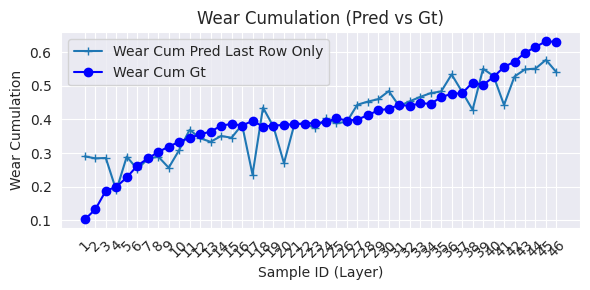

In [15]:
models1 = build_models("rf", RF_PARAMS, KF.get_n_splits())
oof_pred1, tr_rmses1, val_rmses1 = run_cv(X, y, KF, models1)
plot_pred_and_gt({"Last Row Only": oof_pred1})

In [16]:
# Simple stats
sg_stats = sg.groupby("layer").agg({feat: STATS for feat in METADATA["SG_FEAT"]})
sg_stats.columns = [f"{feat}_{stats}" for (feat, stats) in sg_stats.columns]
spike_stats = spike.groupby("layer").agg({feat: STATS for feat in METADATA["SPIKE_FEAT"]})
spike_stats.columns = [f"{feat}_{stats}" for (feat, stats) in spike_stats.columns]
X_stats = sg_stats.merge(spike_stats, right_index=True, left_index=True).reset_index(drop=True)

In [17]:
X = pd.concat([X, X_stats], axis=1)
summarize(X, "X", 1)

=====Summary of X=====


,b_sg,c_sg,d_sg,e,f,g,h,i,b_spike,c_spike,d_spike,b_min_x,b_max_x,b_mean_x,b_median_x,b_std_x,b_skew_x,b_kurtosis_x,c_min_x,c_max_x,c_mean_x,c_median_x,c_std_x,c_skew_x,c_kurtosis_x,d_min_x,d_max_x,d_mean_x,d_median_x,d_std_x,d_skew_x,d_kurtosis_x,e_min,e_max,e_mean,e_median,e_std,e_skew,e_kurtosis,f_min,f_max,f_mean,f_median,f_std,f_skew,f_kurtosis,g_min,g_max,g_mean,g_median,g_std,g_skew,g_kurtosis,h_min,h_max,h_mean,h_median,h_std,h_skew,h_kurtosis,i_min,i_max,i_mean,i_median,i_std,i_skew,i_kurtosis,b_min_y,b_max_y,b_mean_y,b_median_y,b_std_y,b_skew_y,b_kurtosis_y,c_min_y,c_max_y,c_mean_y,c_median_y,c_std_y,c_skew_y,c_kurtosis_y,d_min_y,d_max_y,d_mean_y,d_median_y,d_std_y,d_skew_y,d_kurtosis_y
0,-13.768,-2.128536,-295.100006,-5.355671,-74.046997,13.334249,0.67749,1061,-0.09476,0.09533,-0.157745,-191.641998,-4.241,-98.360077,-98.382004,55.176771,0.003479,-1.198292,-6.042296,6.069761,-0.053967,-1.373249,2.894072,-0.002706,-1.520723,-300.007996,-205.774002,-252.70784,-252.643997,29.04463,-0.007703,-1.212195,-11.205712,11.137051,0.470372,1.620434,4.300067,-0.062328,-1.767713,-74.049004,-74.046997,-74.047417,-74.046997,0.00069,-1.355936,0.524874,13.100797,13.430376,13.328671,13.334249,0.037164,-0.936346,0.898804,0.061035,3.143311,1.906624,2.319336,0.809928,-0.706002,-1.192425,1059,1063,1060.821164,1061.0,0.413409,-1.185091,0.897639,-51.113541,49.180439,0.143537,-0.056856,23.999598,0.018862,-1.069291,-51.764191,47.150219,-1.133218,-0.057198,23.842153,-0.055763,-1.075294,-2.366175,6.692895,2.174765,2.591525,1.517564,-0.371843,-0.932163


Shape: (46, 88)
NaN ratio:


,b_sg,c_sg,i_std,i_median,i_mean,i_max,i_min,h_kurtosis,h_skew,h_std,h_median,h_mean,h_max,h_min,g_kurtosis,g_skew,g_std,g_median,g_mean,g_max,g_min,i_skew,i_kurtosis,b_min_y,c_std_y,d_skew_y,d_std_y,d_median_y,d_mean_y,d_max_y,d_min_y,c_kurtosis_y,c_skew_y,c_median_y,b_max_y,c_mean_y,c_max_y,c_min_y,b_kurtosis_y,b_skew_y,b_std_y,b_median_y,b_mean_y,f_kurtosis,f_skew,f_std,b_min_x,c_max_x,c_min_x,b_kurtosis_x,b_skew_x,b_std_x,b_median_x,b_mean_x,b_max_x,d_spike,c_median_x,c_spike,b_spike,i,h,g,f,e,d_sg,c_mean_x,c_std_x,f_median,e_max,f_mean,f_max,f_min,e_kurtosis,e_skew,e_std,e_median,e_mean,e_min,c_skew_x,d_kurtosis_x,d_skew_x,d_std_x,d_median_x,d_mean_x,d_max_x,d_min_x,c_kurtosis_x,d_kurtosis_y
NaN Ratio,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Zero ratio:


,c_median_y,c_spike,b_sg,i_std,i_median,i_mean,i_max,i_min,h_kurtosis,h_skew,h_std,h_median,h_mean,i_kurtosis,h_max,h_min,g_kurtosis,g_skew,g_std,g_median,g_mean,g_max,i_skew,b_min_y,f_kurtosis,b_max_y,d_skew_y,d_std_y,d_median_y,d_mean_y,d_max_y,d_min_y,c_kurtosis_y,c_skew_y,c_std_y,c_mean_y,c_max_y,c_min_y,b_kurtosis_y,b_skew_y,b_std_y,b_median_y,b_mean_y,g_min,f_skew,c_sg,b_max_x,c_mean_x,c_max_x,c_min_x,b_kurtosis_x,b_skew_x,b_std_x,b_median_x,b_mean_x,b_min_x,c_std_x,d_spike,b_spike,i,h,g,f,e,d_sg,c_median_x,c_skew_x,f_std,e_mean,f_median,f_mean,f_max,f_min,e_kurtosis,e_skew,e_std,e_median,e_max,c_kurtosis_x,e_min,d_kurtosis_x,d_skew_x,d_std_x,d_median_x,d_mean_x,d_max_x,d_min_x,d_kurtosis_y
Zero Ratio,8.695652,4.347826,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


After adding **stats** to help represent the feature distributions in each layer, the performance boosts significantly.

<div class="alert alert-danger">
    <ol>
        <li><strong>大趨勢</strong>抓得更好了</li>
        <li><strong>初期磨耗</strong>以及<strong>尾端劇烈磨耗</strong>仍然為bottleneck</li>
        <li>中段outliers (i.e., <strong>17</strong>和<strong>20</strong>)已經因為新feature的加入改正不少</li>
    </ol>
</div>

=====Performance Summary=====
Train RMSE: 0.010964447769465558 +- 0.0010981011614016438
Val RMSE: 0.024274102757961054 +- 0.014777495121987068
Final score: {'raw': 0.029037716552572555, 'fix_layer1': 0.02199017470221823}


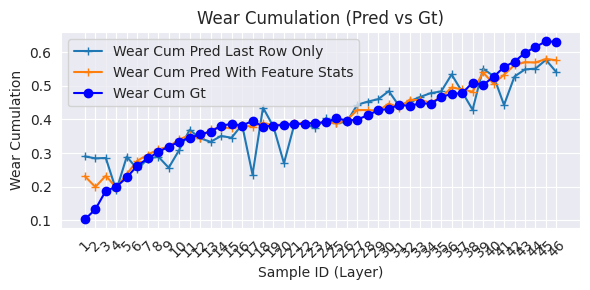

In [20]:
models2 = build_models("rf", RF_PARAMS, KF.get_n_splits())
oof_pred2, tr_rmses2, val_rmses2 = run_cv(X, y, KF, models2)
plot_pred_and_gt({"Last Row Only": oof_pred1, "With Feature Stats": oof_pred2})

<a id="rely"></a>
### *⭐CV Reliability Study*
[**<span style="color:#FEF1FE; background-color:#535d70;border-radius: 5px; padding: 2px">Go to Table of Content</span>**](#toc)

CV的可信度因這次比賽資料的提供方式而被打折。由於我們最後需要將訓練好的模型在**不同的情境**下做測試，而在11/19以前我們並無法得知任何當天測試資料的狀況；也就是說，有別於以往競賽還有randomly splitted的**public leaderboard**可以微微當作參考依據 (但當天可以拿train2模擬public leaderboard)，這次競賽很難貼近最後的情境做驗證。本次競賽資料牽涉到下列四項可能造成分布迥異的因素:
1. 智慧刀把規格
2. 切削工件材質與特性
3. 切削條件與行為
    * 切削條件含[**刀具本身的特性**](#y_sup)

#### Naive `KFold` CV
首先，我們以local `KFold` CV為對象來作研討，在`train1`中做local `KFold` CV會讓training set和validation set共享哪些資訊呢? 很明顯地，智慧刀把規格在46層中基本不會出現變動，因為`train1`中包含的就是使用單一智慧刀把的加工結果；再來，切削工件材質與特性大體上在不同加工層間應該也不會有過大變動 (似乎高速高熱也罕見材質特性出現大變動?)；第三，切削行為應該有機會體現在`sg`和`spike`資訊中 (*e.g.*, 轉速、進給、各軸受力)，不過還是需要特別注意不同加工階段的刀具本身特行所造成的影響。<br>
綜述以上分析，local `KFold` CV可能可以稍微驗證**同智慧刀把、同切削工件材質在不同切削條件與行為**下的磨耗預測泛化能力，故可以預期在可變量較少的情況下，CV結果大機率會是過於樂觀的；因此，對於1、2兩點的模型泛化能力待當天拿到新資料需趕緊驗證。

In [26]:
N_FOLDS = 10
N_SEEDS = 1000
SEEDS = random.sample(range(2**32-1), k=N_SEEDS)

In [31]:
# tr_scores = {"avg": [], "std": []} 
# val_scores = {"avg": [], "std": []}
# final_scores = {"raw": [], "fix": []}

# for i, seed in tqdm(enumerate(SEEDS)):
#     kf = KFold(N_FOLDS, shuffle=True, random_state=seed)
#     models = build_models("rf", RF_PARAMS, N_FOLDS)
#     oof_pred, tr_rmses, val_rmses = run_cv(X, y, kf, models, show_prf=False)
    
#     tr_scores["avg"].append(np.mean(tr_rmses))
#     tr_scores["std"].append(np.std(tr_rmses))
#     val_scores["avg"].append(np.mean(val_rmses))
#     val_scores["std"].append(np.std(val_rmses))
    
#     final_score = get_final_scores(oof_pred)
#     final_scores["raw"].append(final_score["raw"])
#     final_scores["fix"].append(final_score["fix_layer1"])
    
#     if i % 250 == 0:
#         print(f"Final score at round {i}: {final_score}")
        
#     del kf, models, oof_pred, tr_rmses, val_rmses
#     gc.collect()

1it [00:00,  1.48it/s]

Final score at round 0: {'raw': 0.02260917226056572, 'fix_layer1': 0.01727589929829143}


251it [02:50,  1.48it/s]

Final score at round 250: {'raw': 0.02555754911231998, 'fix_layer1': 0.018577442773038112}


501it [05:39,  1.49it/s]

Final score at round 500: {'raw': 0.02422752714399503, 'fix_layer1': 0.01928905963434984}


751it [08:30,  1.50it/s]

Final score at round 750: {'raw': 0.023724220230310962, 'fix_layer1': 0.018834724961956366}


1000it [11:18,  1.47it/s]


In [33]:
# with open("./cache/y_tr_scores_drand.pkl", "wb") as f:
#     pickle.dump(tr_scores, f)
# with open("./cache/y_val_scores_drand.pkl", "wb") as f:
#     pickle.dump(val_scores, f)
# with open("./cache/y_final_scores_drand.pkl", "wb") as f:
#     pickle.dump(final_scores, f)

In [60]:
with open("./cache/y_tr_scores_drand.pkl", "rb") as f:
    tr_scores = pickle.load(f)
with open("./cache/y_val_scores_drand.pkl", "rb") as f:
    val_scores = pickle.load(f)
with open("./cache/y_final_scores_drand.pkl", "rb") as f:
    final_scores = pickle.load(f)

Fold切不好還是有可能會讓模型泛化能力不好，或許可以歸因給**切削條件及行為**差異較大的緣故。

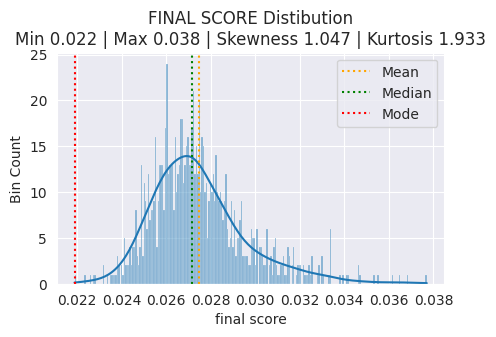

In [61]:
plot_univar_dist(np.array(final_scores["raw"]), feature="final score", figsize=(5, 3))

Fold之間的performance變動可能滿大的 (最大std可以到0.028)，依照前面的分析，推測為模型看過的樣本之**切削條件及行為**差不多，但卻要讓他在差異較大的validation set (*e.g.*, 含有**初期及尾端烈磨耗樣本**)上做預測。

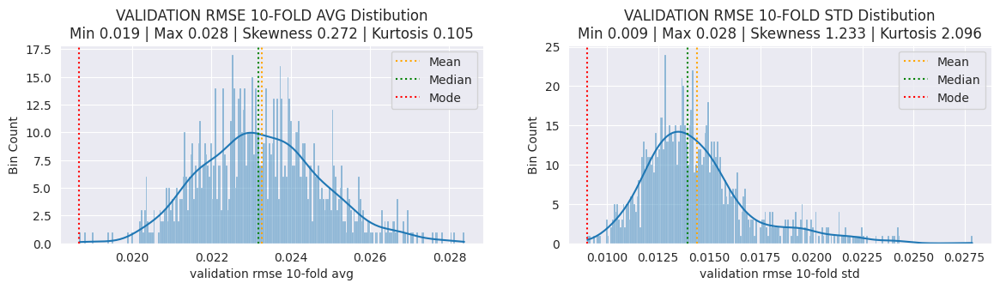

In [62]:
fig, axes = plt.subplots(figsize=(14, 3), nrows=1, ncols=2)
plot_univar_dist(np.array(val_scores["avg"]), feature="validation rmse 10-fold avg", ax=axes[0])
plot_univar_dist(np.array(val_scores["std"]), feature="validation rmse 10-fold std", ax=axes[1])

下面重新審視`KFold`中10-fold std最大與最小的狀況，可以發現std大的情境下，有其中一個validation set含有**第1、2、3以及第45層**，這意味著**劇烈磨耗**的樣本幾乎都落到validation set中，所以performance並不理想。

<div class="alert alert-danger">
    <h5>若較相近的layer剛好有在training set中 (e.g., layer2在val，但1和3在train)，則有機會因為讓模型看過較相近的切削行為或條件而獲得補償。</h5>
</div>

=====Performance Summary=====
Train RMSE: 0.010077192730952738 +- 0.0009042913868526298
Val RMSE: 0.023761883997130216 +- 0.027882600155041775
Final score: {'raw': 0.034713551307486656, 'fix_layer1': 0.025800126633828385}


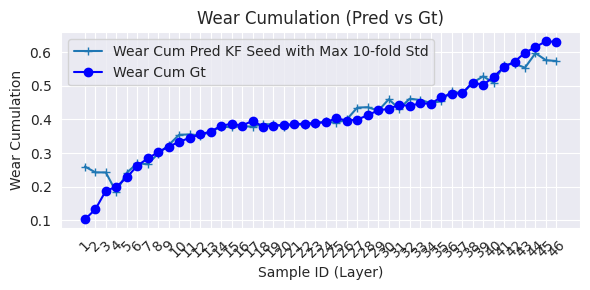

In [44]:
seed_with_max_std = SEEDS[np.argmax(val_scores["std"])]
kf_worst = KFold(N_FOLDS, shuffle=True, random_state=seed_with_max_std)
models_worst = build_models("rf", RF_PARAMS, N_FOLDS)
oof_pred_worst, tr_rmses_worst, val_rmses_worst = run_cv(X, y, kf_worst, models_worst)
plot_pred_and_gt({"KF Seed with Max 10-fold Std": oof_pred_worst})

=====Performance Summary=====
Train RMSE: 0.010367843818355973 +- 0.0007263252551826551
Val RMSE: 0.024317073594443264 +- 0.009033651810426292
Final score: {'raw': 0.026179735312768473, 'fix_layer1': 0.021307837182138304}


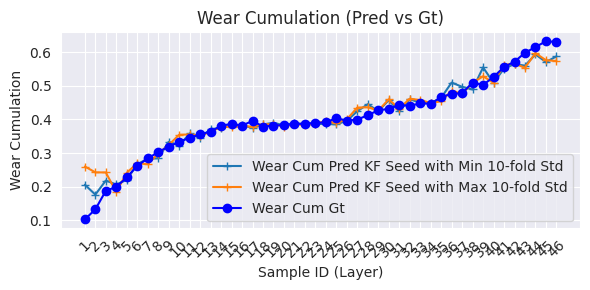

In [47]:
seed_with_min_std = SEEDS[np.argmin(val_scores["std"])]
kf_best = KFold(N_FOLDS, shuffle=True, random_state=seed_with_min_std)
models_best = build_models("rf", RF_PARAMS, N_FOLDS)
oof_pred_best, tr_rmses_best, val_rmses_best = run_cv(X, y, kf_best, models_best)
plot_pred_and_gt({"KF Seed with Min 10-fold Std": oof_pred_best,
                  "KF Seed with Max 10-fold Std": oof_pred_worst})

In [56]:
val_idx2rmse_worst = {tuple(val_idx): val_rmse for (_, val_idx), val_rmse in zip(kf_worst.split(X), val_rmses_worst)}
val_idx2rmse_best = {tuple(val_idx): val_rmse for (_, val_idx), val_rmse in zip(kf_best.split(X), val_rmses_best)}
val_idx2rmse_worst = dict(sorted(val_idx2rmse_worst.items(), key=lambda item: item[1], reverse=True))
val_idx2rmse_best = dict(sorted(val_idx2rmse_best.items(), key=lambda item: item[1], reverse=True))

In [57]:
val_idx2rmse_worst

{(0, 1, 2, 44): 0.10391829026815792,
 (5, 21, 38, 42, 45): 0.03436591282872831,
 (20, 22, 26, 39): 0.019860980401591975,
 (3, 4, 16, 27): 0.017922764806145883,
 (6, 7, 8, 9, 29): 0.017818105102095985,
 (11, 18, 30, 31): 0.012538795417387118,
 (12, 14, 17, 24, 35): 0.009297753847360743,
 (15, 23, 25, 40, 43): 0.00889489879406416,
 (10, 13, 19, 28, 32): 0.0067861992779021905,
 (33, 34, 36, 37, 41): 0.006215139227867876}

In [59]:
val_idx2rmse_best

{(0, 3, 19, 33, 34): 0.04625837657577242,
 (7, 27, 39, 45): 0.02972671578134072,
 (17, 22, 23, 25, 44): 0.0280326215238155,
 (18, 21, 26, 36, 38): 0.027627301006545656,
 (1, 5, 9, 24): 0.02476687244395052,
 (6, 11, 29, 35, 37): 0.021562609348912846,
 (12, 20, 28, 42): 0.019679561786918515,
 (2, 8, 14, 32, 41): 0.01555277917110844,
 (13, 16, 31, 40): 0.01531577681380781,
 (4, 10, 15, 30, 43): 0.014648121492260203}

## 以下尚未整理XD

#### Phase-Grouped CV

#### WearDiff-Grouped CV

#### WearDiff-Stratified CV

<a id="fe"></a>
### *(Event-Based/Significance-Based) Feature Engineering*
[**<span style="color:#FEF1FE; background-color:#535d70;border-radius: 5px; padding: 2px">Go to Table of Content</span>**](#toc)

<div class="alert alert-warning">
怎樣的feature可以算做帶來significant CV boost?
</div>

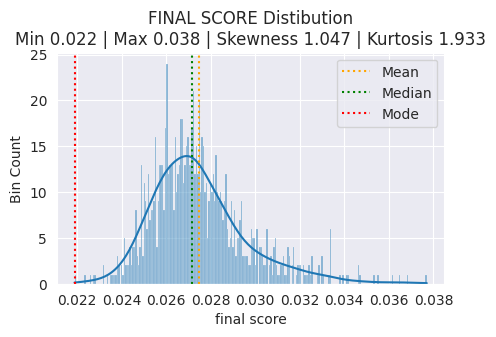

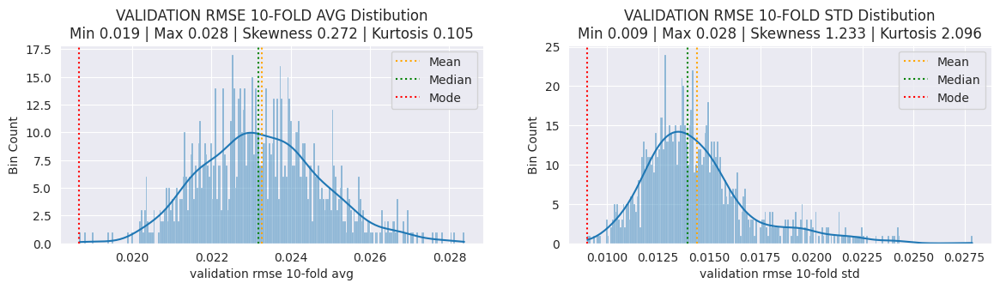

In [63]:
plot_univar_dist(np.array(final_scores["raw"]), feature="final score", figsize=(5, 3))
fig, axes = plt.subplots(figsize=(14, 3), nrows=1, ncols=2)
plot_univar_dist(np.array(val_scores["avg"]), feature="validation rmse 10-fold avg", ax=axes[0])
plot_univar_dist(np.array(val_scores["std"]), feature="validation rmse 10-fold std", ax=axes[1])

tmp 10-fold 5 -seeds?

In [64]:
import librosa, librosa.display

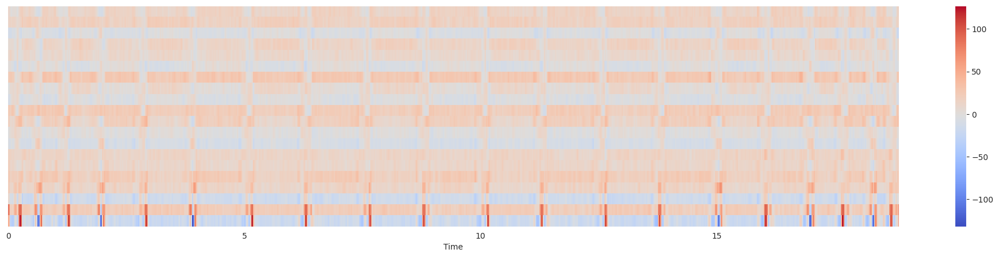

In [67]:
mfcc = librosa.feature.mfcc(sg_gp.get_group(1)['c'].values)
plt.figure(figsize=(25, 5))
librosa.display.specshow(mfcc, x_axis='time')
plt.colorbar()

* Layer 間時序性重要嗎，是否需要考慮使用TS split?
* 1-layer out CV scheme
* DA with different chunk size in each layer
* Tree-based models w/ fixed number of trees, huber or gamma objective and sample weights
* 加入前面的磨耗或磨耗累積為feature?
* 混合 direct和difference模型?
* 嘗試不同CV消弭前面提到的極端樣本問題?